In [1]:
import math
import numpy as np

import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default='notebook'
%matplotlib inline

import tensorflow as tf
tf.keras.backend.clear_session()
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
tf.debugging.set_log_device_placement(True)

import logging
logger = tf.get_logger()
logger.setLevel(logging.ERROR)

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # FATAL
logging.getLogger('tensorflow').setLevel(logging.FATAL)

Num GPUs Available:  1


In [2]:
def load_horses_orig(path, image_size):   
    mask_path = path + 'masks/'
    image_path = path + 'images/'
    images = []
    masks = []
    test_images = []
    test_masks = []
    
    for i in range(328):
        
        orig_im = cv2.imread(image_path + 'image-{}.png'.format(i))
        orig_im= cv2.cvtColor(orig_im, cv2.COLOR_RGB2BGR)
        
        low_im = cv2.resize(orig_im, dsize=(image_size, image_size))

        orig_mask = cv2.imread(mask_path + 'mask-{}.png'.format(i))
        low_mask = cv2.resize(orig_mask, dsize=(image_size, image_size))
        low_mask = cv2.cvtColor(low_mask, cv2.COLOR_RGB2GRAY)
        bin_mask = (low_mask > 0) + 0
        
        images.append(low_im)
        masks.append(bin_mask)
    
    xtest = np.reshape(np.array(images[250:]), (-1,image_size*image_size*3))
    ytest = np.reshape(np.array(masks[250:]), (-1, image_size * image_size))
    xdata = np.reshape(np.array(images[:200]), (-1,image_size*image_size*3))
    ydata = np.reshape(np.array(masks[:200]), (-1, image_size * image_size))
    yval =  np.reshape(np.array(masks[200:250]), (-1, image_size * image_size))
    xval = np.reshape(np.array(images[200:250]), (-1,image_size*image_size*3))

    return xdata, xval, xtest, ydata, yval, ytest

In [3]:
#change the path address 
path = './horses/'
image_size = 32
xdata, xval, xtest, ydata, yval, ytest = load_horses_orig(path, image_size)

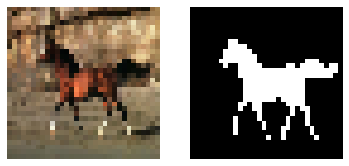

(3072,) (1024,)


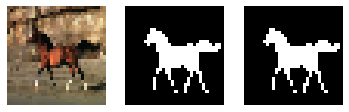

In [4]:
def draw(image, mask):
    fig, (ax1,ax2) = plt.subplots(1,2) 
    ax1.axis('off')
    ax2.axis('off')
    ax1.imshow(np.reshape(image, (image_size,image_size,3)))
    ax2.imshow(np.reshape(mask, (image_size,image_size)), cmap=plt.cm.gray)
    plt.show()

draw(xdata[0], ydata[0])
print(xdata[0].shape, ydata[0].shape)

def draw_all(image, real_mask, fake_mask):
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    ax1.axis('off')
    ax2.axis('off')
    ax3.axis('off')
    ax1.imshow(np.reshape(image, (image_size,image_size,3)))
    ax2.imshow(np.reshape(real_mask, (image_size,image_size)), cmap=plt.cm.gray)
    ax3.imshow(np.reshape(fake_mask, (image_size,image_size)), cmap=plt.cm.gray)
    plt.show()
    
draw_all(xdata[0], ydata[0], ydata[0])

In [5]:
# Do not change this cell
def iou(ytrue, yprediction):
    yp = yprediction
    yt = ytrue
    yp = yp > 0.5 + 0
    intersect = np.sum(np.minimum(yp, yt),1)
    union = np.sum(np.maximum(yp, yt),1)
    return np.average(intersect / (union+0.0)) # to avoid nan i guess..

In [6]:
assert iou(ydata, ydata) == 1.0

# FC GAN

In [7]:
class Discriminator(tf.keras.Model):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.concat_layer = tf.keras.layers.Concatenate(axis=1)
        self.fc1 = tf.keras.layers.Dense(128, activation = tf.nn.softplus)
        self.fc2 = tf.keras.layers.Dense(256, activation = tf.nn.softplus)
        self.fc3 = tf.keras.layers.Dense(512, activation = tf.nn.softplus)
        self.fc4 = tf.keras.layers.Dense(1024, activation = tf.nn.softplus)
        self.fc_score = tf.keras.layers.Dense(1)

    def call(self, x, yt, y):
        # image x = [bs, 3072]
        # true_label yt = [bs, 1024]
        # fake_label y = [bs, 1024]
        # concat = [bs, 5120]
        x = tf.cast(x, tf.float32)
        y = tf.cast(y, tf.float32)
        yt = tf.cast(yt, tf.float32)
        
        x = self.concat_layer([x, y, yt])
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = self.fc4(x)
        x = self.fc_score(x)
        return x

class Generator(tf.keras.Model):
    def __init__(self):
        super(Generator, self).__init__()
        
        self.concat_layer = tf.keras.layers.Concatenate(axis=1)
        self.fc1 = tf.keras.layers.Dense(1024, activation = tf.nn.softplus)
        self.fc2 = tf.keras.layers.Dense(512, activation = tf.nn.softplus)
        self.fc3 = tf.keras.layers.Dense(128, activation = tf.nn.softplus)
        self.fc4 = tf.keras.layers.Dense(64, activation = tf.nn.softplus)
        self.fc5 = tf.keras.layers.Dense(32, activation = tf.nn.softplus)
        self.fc_energy = tf.keras.layers.Dense(1) # energy value
    
    def call(self, x, z):
        # noise_inputs z = [bs, 1024]
        # image x = [bs, 3072]
        # concat = [bs, 4096]
        x = tf.cast(x, tf.float32)
        x = self.concat_layer([x, z])
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = self.fc4(x)
        x = self.fc5(x)
        x = self.fc_energy(x)
        return x

In [8]:
def compute_gradient(x, y):
    y = tf.Variable(y)
    with tf.GradientTape() as t:
        t.watch(y)
        energy = gen(x, y)
    return t.gradient(energy, y)

def unrolled_inf(images, fake_label, inf_iter, inf_rate):
    yp_ind = fake_label;    current_yp_ind = yp_ind
    
    yp_ar = []
    for i in range(inf_iter):
        gradients = compute_gradient(images, yp_ind)
        
        next_yp_ind = tf.math.add(current_yp_ind, tf.math.multiply(inf_rate, gradients))
        
        # Langevin dynamics
        temp = tf.cast(inf_rate/2, tf.float32)
        temp = temp * gradients + tf.random.normal(gradients.get_shape().as_list(), mean=0, stddev=inf_rate)
        next_yp_ind = next_yp_ind + temp
        current_yp_ind = next_yp_ind
        
        yp_ind = current_yp_ind
        yp_ar.append(yp_ind)
        
    yp = yp_ar[-1]
    yp = tf.nn.sigmoid(yp)
    return yp

def test_time_inf(images, fake_label, inf_iter, inf_rate):
    yp_ind = fake_label;    current_yp_ind = yp_ind
    
    yp_ar = []
    for i in range(inf_iter):
        gradients = compute_gradient(images, yp_ind)
        
        next_yp_ind = tf.math.add(current_yp_ind, tf.math.multiply(inf_rate, gradients))
        
        # Langevin dynamics
        temp = tf.cast(inf_rate/2, tf.float32)
        temp = temp * gradients
        next_yp_ind = next_yp_ind + temp
        current_yp_ind = next_yp_ind
        
        yp_ind = current_yp_ind
        yp_ar.append(yp_ind)
        
    yp = yp_ar[-1]
    yp = tf.nn.sigmoid(yp)
    return yp

In [9]:
def plot_figure(loss, arange, brange, start, end, step, plot_name):
    axis_length = len(np.linspace(start, end, step))
    loss = loss.numpy().reshape(-1, axis_length)

    # plot the surface plot with plotly's Surface
    fig = go.Figure(data=go.Surface(z=loss,
                                    x=arange,
                                    y=brange))

    # add a countour plot
    fig.update_traces(contours_z=dict(show=True, usecolormap=True,
                                      highlightcolor="limegreen", project_z=True))

    # annotate the plot
    fig.update_layout(title=plot_name,
                      scene=dict(
                        xaxis_title='Pred. Label Axis-0',
                        yaxis_title='Pred. Label Axis-1',
                        zaxis_title=plot_name),
                      width=700, height=700)

    fig.show()
    
def generate_vectors(real_image, real_label, fake_label, start, end, step):
    arange = np.linspace(start, end, step)
    brange = np.linspace(start, end, step)

    alen = arange.shape[0]
    blen = brange.shape[0]

    r1 = np.random.uniform(0, 1, (fake_label.shape[0], image_size * image_size))
    r1[:,0] = 1 - r1[:,1]
    r2 = np.random.uniform(0, 1, (fake_label.shape[0], image_size * image_size))
    r2[:,0] = 1 - r2[:,1]
    
    y_img = np.zeros((alen*blen, fake_label.shape[0], image_size * image_size * 3))
    y_pred = np.zeros((alen*blen, fake_label.shape[0], image_size * image_size))
    y_true = np.zeros((alen*blen, fake_label.shape[0], image_size * image_size))
    for b in range(0,blen):
        for a in range(0,alen):
            k = arange[a]
            l = brange[b]
            y_pred[b*alen+a] = tf.clip_by_value(fake_label[0, :] + l*r1[0, :] + k*r2[0, :], 0.0, 1.0) # just one horse
            y_true[b*alen+a] = real_label[0, :]
            y_img[b*alen+a] = real_image[0, :]
    return arange, brange, y_img, y_pred, y_true

def plot_contour_ce(real_image, real_label, inf_iter, inf_rate, start, end, step):
    batch_size = real_label.shape[0]
    z = tf.random.uniform([batch_size, image_size*image_size], 0.0, 1.0)
    fake_label = test_time_inf(real_image, z, inf_iter, inf_rate)
    
    fake_label = np.array(fake_label).reshape(-1, image_size * image_size)
    real_label = np.array(real_label).reshape(-1, image_size * image_size)
    real_image = np.array(real_image).reshape(-1, image_size * image_size * 3)

    arange, brange, y_img, y_pred, y_true = generate_vectors(real_image, real_label, fake_label, start, end, step)

    # CE Loss
    loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    plot_figure(loss, arange, brange, start, end, step, 'Cross Entropy')
    
    
def plot_contour_adv(real_image, real_label, inf_iter, inf_rate, start, end, step):
    batch_size = real_label.shape[0]
    z = tf.random.uniform([batch_size, image_size*image_size], 0.0, 1.0)
    fake_label = test_time_inf(real_image, z, inf_iter, inf_rate)
    
    fake_label = np.array(fake_label).reshape(-1, image_size * image_size)
    real_label = np.array(real_label).reshape(-1, image_size * image_size)
    real_image = np.array(real_image).reshape(-1, image_size * image_size * 3)
    
    # Adv loss
    arange, brange, y_img, y_pred, y_true = generate_vectors(real_image, real_label, fake_label, start, end, step)
    
    real_image = y_img.reshape(-1, image_size* image_size* 3)
    real_label = y_true.reshape(-1, image_size* image_size)
    fake_label = y_pred.reshape(-1, image_size* image_size)
    
    # disc signals
    real_score = dis(real_image, real_label, real_label)
    fake_score = dis(real_image, real_label, fake_label)

    # interpolate
    alpha_ = tf.random.uniform([fake_label.shape[0], 1], 0.0, 1.0)
    inter_sample = fake_label * alpha_ + real_label * (1 - alpha_)
    with tf.GradientTape() as tape_gp:
        tape_gp.watch(inter_sample)
        inter_score = dis(real_image, real_label, inter_sample)
    gp_gradients = tape_gp.gradient(inter_score, inter_sample)
    
    # gradient penalty
    gp_gradients_norm = tf.sqrt(tf.reduce_sum(tf.square(gp_gradients), axis = [1]))
    gp = tf.reduce_mean((gp_gradients_norm - 1.0) ** 2)

    # loss
    loss = fake_score - real_score + (gp * 10)
    plot_figure(loss, arange, brange, start, end, step, 'Adversarial loss')
    
    
def plot_hist(fake, real):
    fake = np.array(fake).reshape(-1, 1)
    real = np.array(real).reshape(-1, 1)
    bins = len(fake)
    plt.figure(figsize=(15,5))
    plt.hist(fake, bins, alpha=0.5, color='blue', label='Fake')
    plt.hist(real, bins, alpha=0.5, color='orange', label='Real')
    plt.legend(loc='upper right')
    plt.show()
    
def calc_iou(images, labels, inf_iter, inf_rate):
    batch_size = labels.shape[0]
    z = tf.random.uniform([batch_size, image_size * image_size], 0.0, 1.0)
    fake_label = test_time_inf(images, z, inf_iter, inf_rate)
    return iou(labels, fake_label)

def draw_test(images, labels, inf_iter, inf_rate, name):
    batch_size = labels.shape[0]
    z = tf.random.uniform([batch_size, image_size * image_size], 0.0, 1.0)
    fake_label = test_time_inf(images, z, inf_iter, inf_rate)
    iou_score = iou(labels, fake_label)
    print('\n' + name + ' iou_score %:', round(iou_score*100, 2))
    
    for i in range(10):
        draw_all(images[i], labels[i], fake_label[i])
        
def plot_iou(epoch, train_iou, val_iou, test_iou):
    plt.plot(np.arange(epoch+1), np.array(train_iou), label = "train")
    plt.plot(np.arange(epoch+1), np.array(val_iou), label = "test")
    plt.plot(np.arange(epoch+1), np.array(test_iou), label = "valid")
    plt.xlabel('Epoch')
    plt.ylabel('IOU Score')
    plt.legend()
    plt.show()

In [10]:
def train_step_gen(real_image, real_label, inf_iter, inf_rate, pt_loss, alpha):
    batch_size = real_image.get_shape().as_list()[0]
    z = tf.random.uniform([batch_size, image_size * image_size], 0.0, 1.0)
    real_label = tf.cast(real_label, dtype=tf.float32)
    with tf.GradientTape() as tape:
        fake_label = unrolled_inf(real_image, z, inf_iter, inf_rate)
        fake_score = dis(real_image, real_label, fake_label)
        loss = tf.reduce_mean(fake_score) + (pt_loss * alpha)
    gradients = tape.gradient(loss, gen.trainable_variables)
    gen_opt.apply_gradients(zip(gradients, gen.trainable_variables))
    gen_loss(loss)

def train_step_dis(real_image, real_label, inf_iter, inf_rate):
    batch_size = real_image.get_shape().as_list()[0]
    real_label = tf.cast(real_label, dtype=tf.float32)
    z = tf.random.uniform([batch_size, image_size * image_size], 0.0, 1.0)
        
    with tf.GradientTape() as tape:
        fake_label = unrolled_inf(real_image, z, inf_iter, inf_rate)
        real_score = dis(real_image, real_label, real_label)
        fake_score = dis(real_image, real_label, fake_label)
        
        alpha_ = tf.random.uniform([batch_size, 1], 0.0, 1.0)
        inter_sample = fake_label * alpha_ + real_label * (1 - alpha_)
        with tf.GradientTape() as tape_gp:
            tape_gp.watch(inter_sample)
            inter_score = dis(real_image, real_label, inter_sample)
        gp_gradients = tape_gp.gradient(inter_score, inter_sample)
        
        # gradient penalty
        gp_gradients_norm = tf.sqrt(tf.reduce_sum(tf.square(gp_gradients), axis = [1]))
        gp = tf.reduce_mean((gp_gradients_norm - 1.0) ** 2)
        
        # adv loss
        loss = tf.reduce_mean(fake_score) - tf.reduce_mean(real_score) + (gp * 10)
    
    gradients = tape.gradient(loss, dis.trainable_variables)
    dis_opt.apply_gradients(zip(gradients, dis.trainable_variables))
    
    dis_loss(loss)
    adv_loss(loss - gp * 10)
    return fake_score, real_score
    
def pretrain_gen(real_image, real_label, inf_iter, inf_rate):
    batch_size = real_image.get_shape().as_list()[0]
    real_label = tf.cast(real_label, dtype=tf.float32)
    z = tf.random.uniform([batch_size, image_size * image_size], 0.0, 1.0)
    with tf.GradientTape() as tape:
        fake_label = unrolled_inf(real_image, z, inf_iter, inf_rate)
        loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(real_label, fake_label))
    gradients = tape.gradient(loss, gen.trainable_variables)
    gen_opt_pt.apply_gradients(zip(gradients, gen.trainable_variables))
    gen_pretrain_loss(loss)
    return loss

def train(data, n_epoch, n_update_dis, inf_iter, inf_rate, pt_gen, alpha):
    train_iou = []; val_iou = []; test_iou = [];
    for epoch in range(n_epoch):
        print('\nepoch:', epoch)
        
        if epoch == 0:
            pt_loss = 0
        
        fake_store = [];   real_store = [];
        for images, labels in train_dataset:
            
            # train gen
            if epoch > 0:
                if pt_gen:
                    pt_loss = pretrain_gen(images, labels, inf_iter, inf_rate)
                train_step_gen(images, labels, inf_iter, inf_rate, pt_loss, alpha)
            
            # train disc
            for i in range(n_update_dis):
                fake_sc, real_sc = train_step_dis(images, labels, inf_iter, inf_rate)
            fake_store.append(fake_sc.numpy())
            real_store.append(real_sc.numpy())
            
        # store iou progression
        train_iou.append(calc_iou(xdata, ydata, inf_iter, inf_rate))
        val_iou.append(calc_iou(xtest, ytest, inf_iter, inf_rate))
        test_iou.append(calc_iou(xval, yval, inf_iter, inf_rate))
        
        if epoch % 20 == 0:
            plot_hist(fake_store, real_store)
            
            start, end, step = 0.0, 20.0, 10
            plot_contour_ce(xtest, ytest, inf_iter, inf_rate, start, end, step)
            
            start, end, step = -30.0, 20.0, 10
            plot_contour_adv(xtest, ytest, inf_iter, inf_rate, start, end, step)

            draw_test(xdata, ydata, inf_iter, inf_rate, 'train')
            draw_test(xtest, ytest, inf_iter, inf_rate, 'test')
            draw_test(xval, yval, inf_iter, inf_rate, 'valid')
            
            if epoch > 0:
                plot_iou(epoch, train_iou, val_iou, test_iou)
                
        template = 'PT Gen Loss: {}, Gen Loss: {}, Dis Loss: {}, Adv Loss: {}'
        print (template.format(gen_pretrain_loss.result(), gen_loss.result(), dis_loss.result(), adv_loss.result()))
        dis_loss.reset_states()
        adv_loss.reset_states()
        gen_loss.reset_states()
        gen_pretrain_loss.reset_states()

Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousRandomSeedGenerator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ShuffleDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op BatchDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0

epoch: 0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0

Executing op Greater in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0


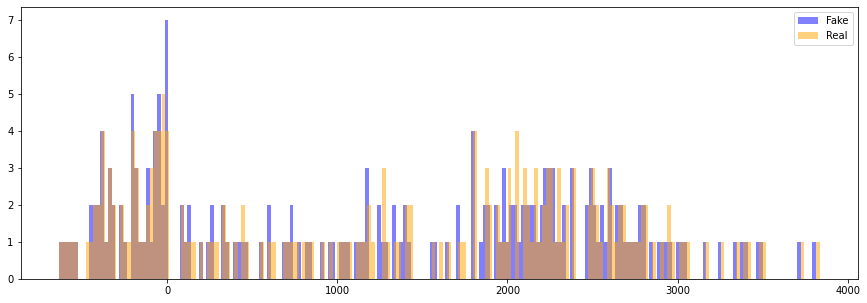

Executing op Minimum in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Maximum in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Log in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Neg in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0



train iou_score %: 25.09
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0


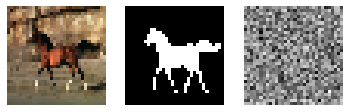

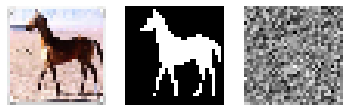

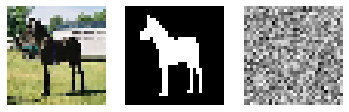

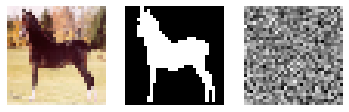

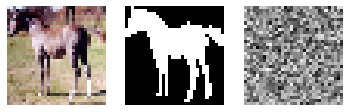

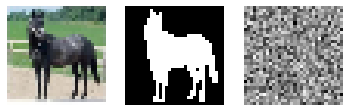

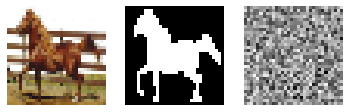

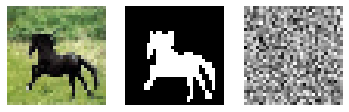

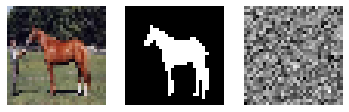

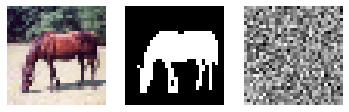


test iou_score %: 28.18


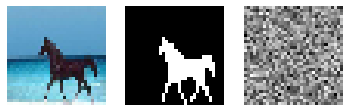

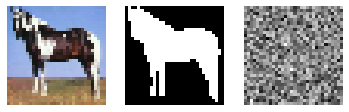

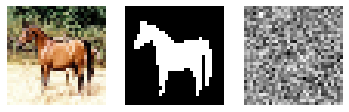

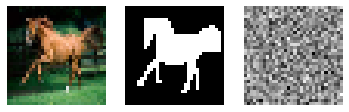

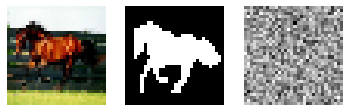

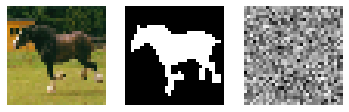

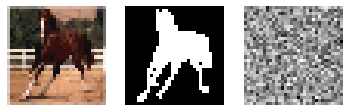

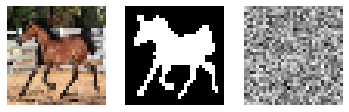

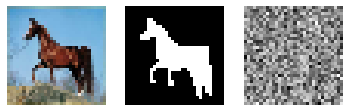

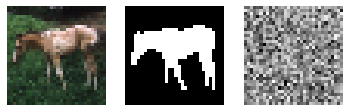


valid iou_score %: 27.17


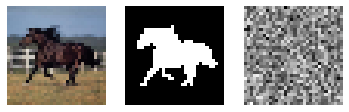

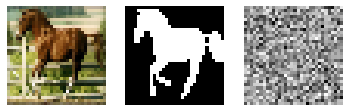

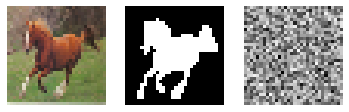

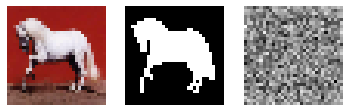

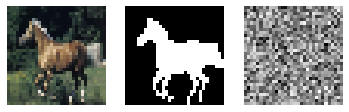

...

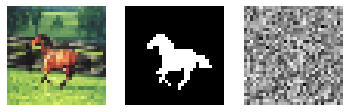

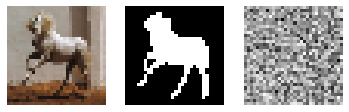

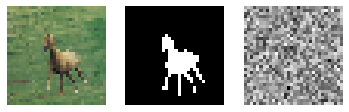

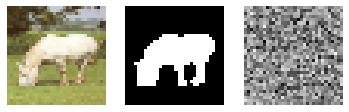

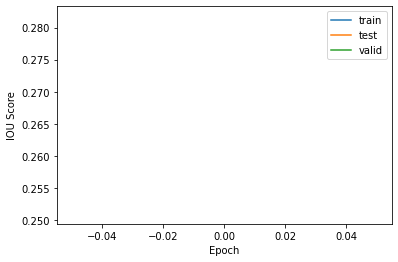

PT Gen Loss: 0.0, Gen Loss: 0.0, Dis Loss: -8.614852905273438, Adv Loss: -11.405569076538086

epoch: 1
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Minimum in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Maximum in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Log in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Reciprocal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ZerosLike in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GreaterEqual in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op SelectV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LessEqual in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddN in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

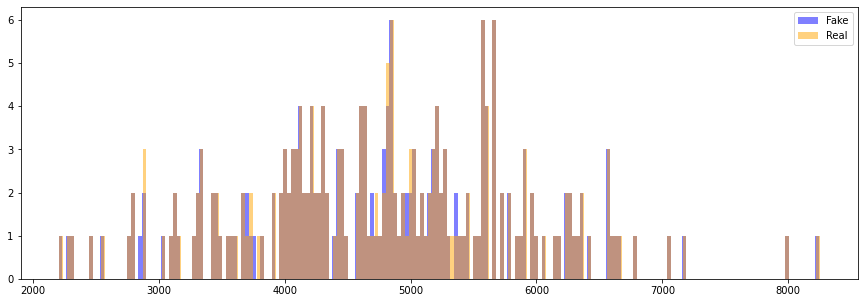


train iou_score %: 49.12


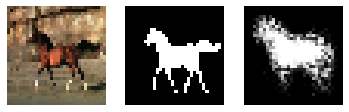

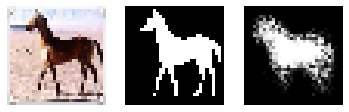

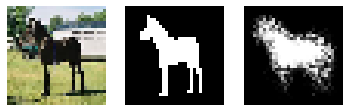

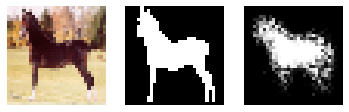

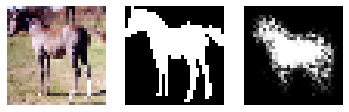

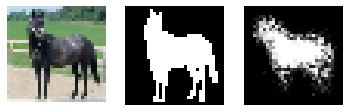

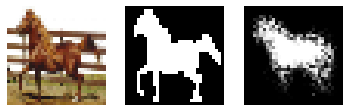

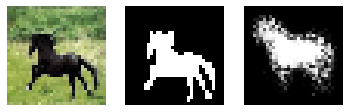

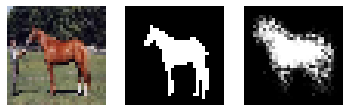

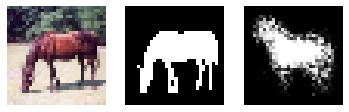


test iou_score %: 48.73


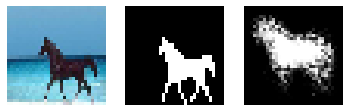

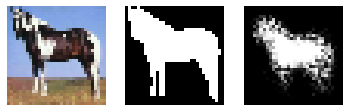

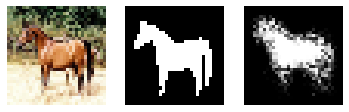

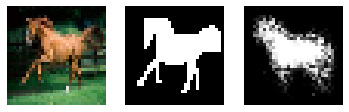

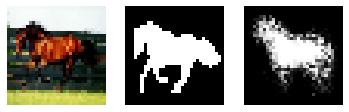

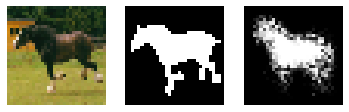

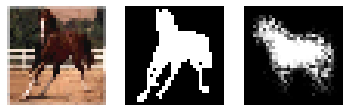

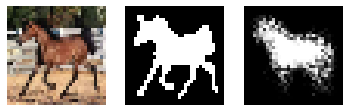

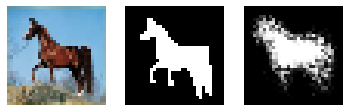

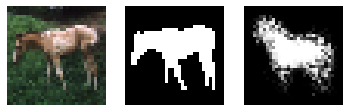


valid iou_score %: 46.5


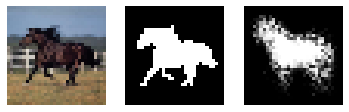

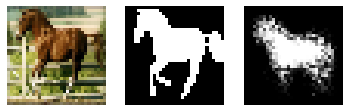

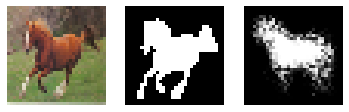

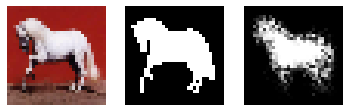

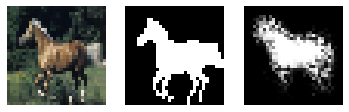

...

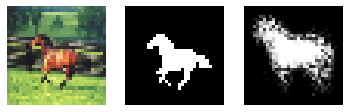

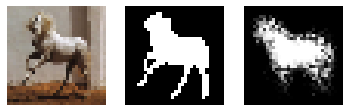

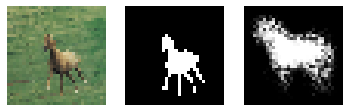

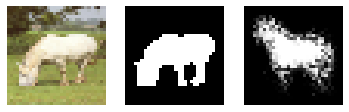

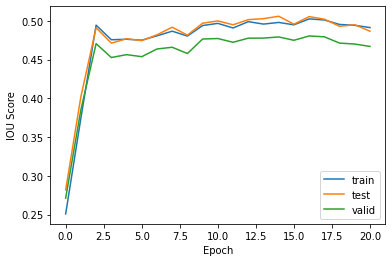

PT Gen Loss: 1.2884588241577148, Gen Loss: 4766.60546875, Dis Loss: -2.8205878734588623, Adv Loss: -3.021064519882202

epoch: 21
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2973530292510986, Gen Loss: 4704.75048828125, Dis Loss: -2.7597429752349854, Adv Loss: -2.927011728286743

epoch: 22
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2897827625274658, Gen Loss: 4575.9462890625, Dis Loss: -2.9357876777648926, Adv Loss: -3.1369237899780273

epoch: 23
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2780472040176392, Gen Loss: 4220.83740234375, Dis Loss: -2.8889739513397217, Adv Loss: -3.0695898

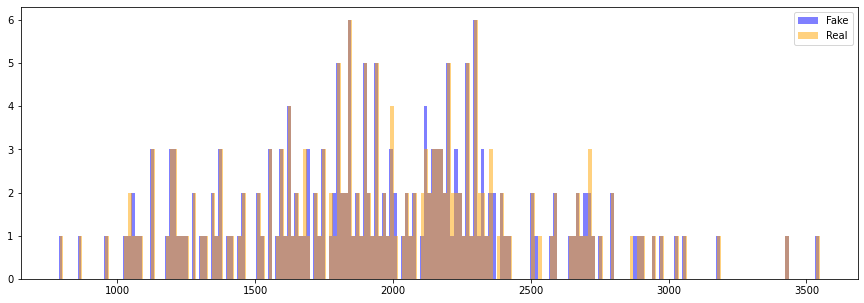


train iou_score %: 49.93


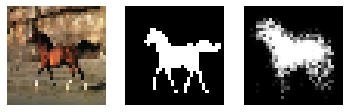

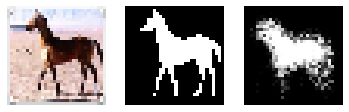

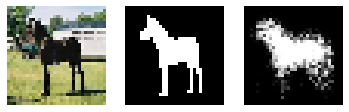

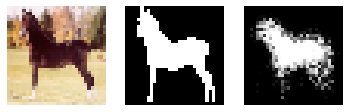

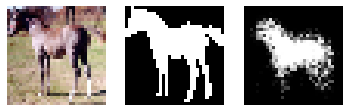

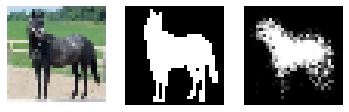

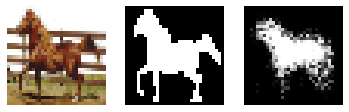

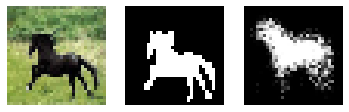

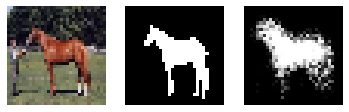

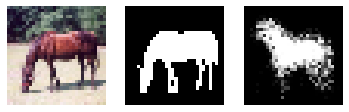


test iou_score %: 49.54


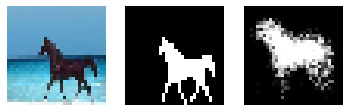

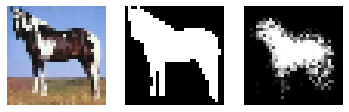

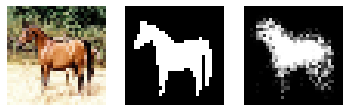

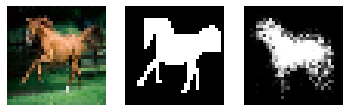

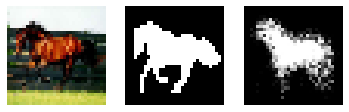

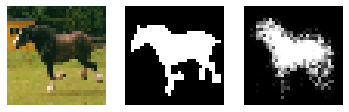

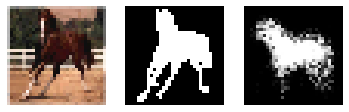

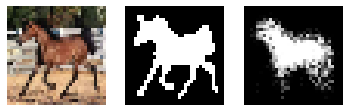

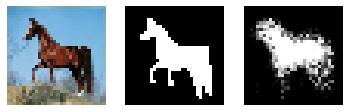

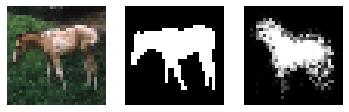


valid iou_score %: 47.65


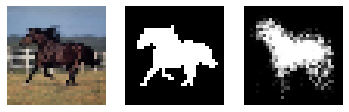

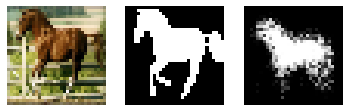

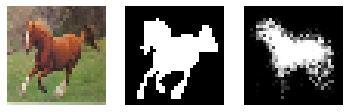

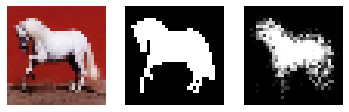

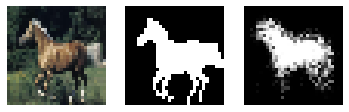

...

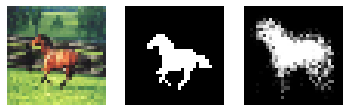

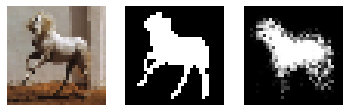

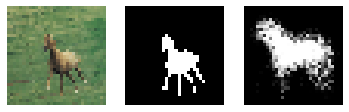

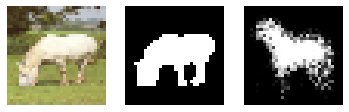

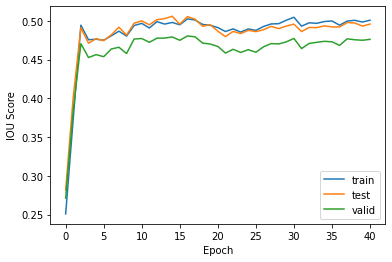

PT Gen Loss: 1.2795915603637695, Gen Loss: 1961.8800048828125, Dis Loss: -2.422130823135376, Adv Loss: -2.56298828125

epoch: 41
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2707090377807617, Gen Loss: 2074.945556640625, Dis Loss: -2.5817458629608154, Adv Loss: -2.734248161315918

epoch: 42
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2709184885025024, Gen Loss: 1696.7884521484375, Dis Loss: -2.565185308456421, Adv Loss: -2.713242292404175

epoch: 43
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2728809118270874, Gen Loss: 1437.2220458984375, Dis Loss: -2.5647575855255127, Adv Loss: -2.722

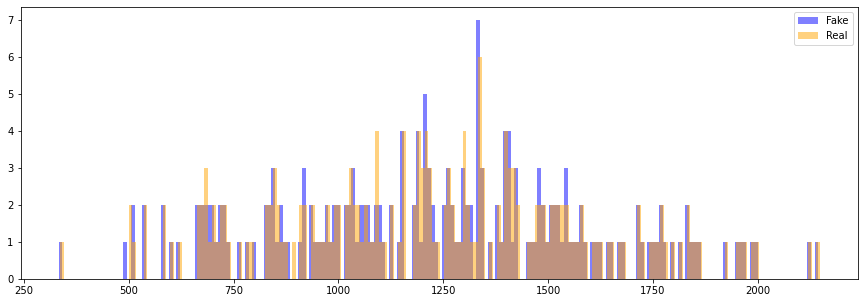


train iou_score %: 50.9


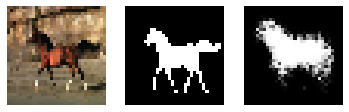

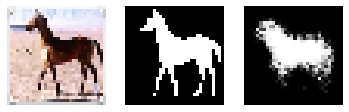

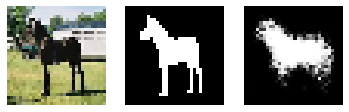

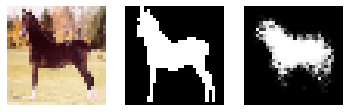

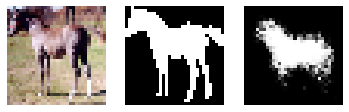

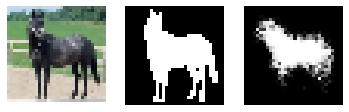

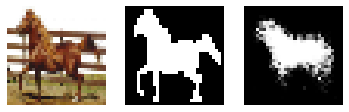

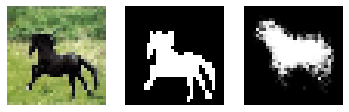

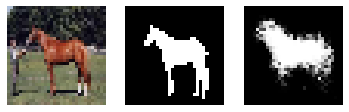

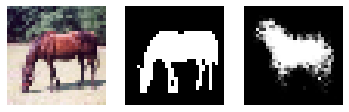


test iou_score %: 50.18


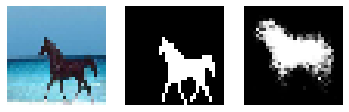

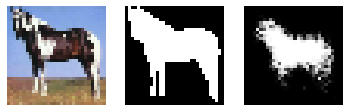

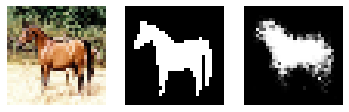

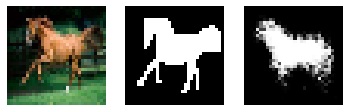

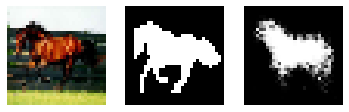

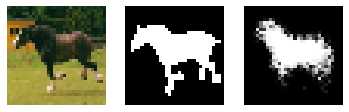

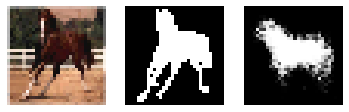

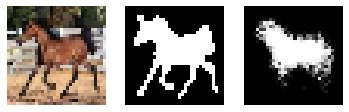

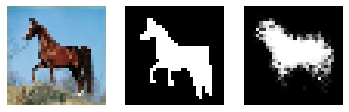

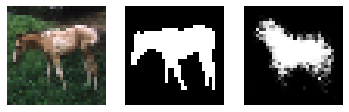


valid iou_score %: 48.12


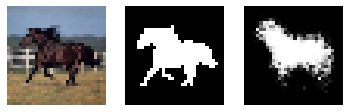

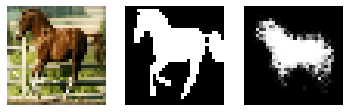

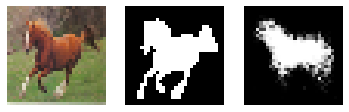

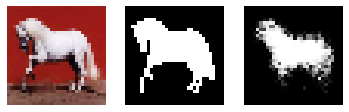

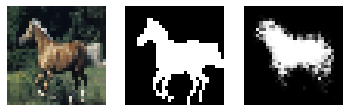

...

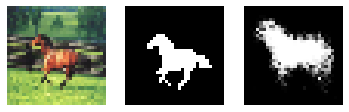

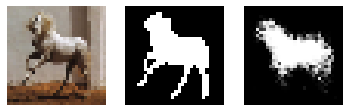

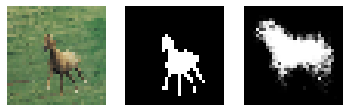

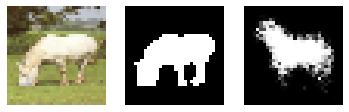

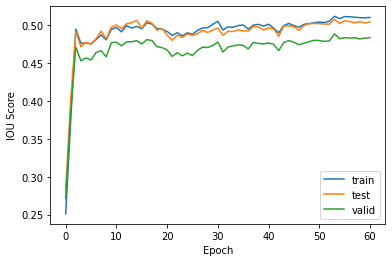

PT Gen Loss: 1.2644165754318237, Gen Loss: 1228.5030517578125, Dis Loss: -2.1836681365966797, Adv Loss: -2.3108227252960205

epoch: 61
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2630599737167358, Gen Loss: 1057.7266845703125, Dis Loss: -2.1083507537841797, Adv Loss: -2.218981981277466

epoch: 62
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2587764263153076, Gen Loss: 1268.38134765625, Dis Loss: -2.180175304412842, Adv Loss: -2.3083252906799316

epoch: 63
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2702945470809937, Gen Loss: 1314.5074462890625, Dis Loss: -2.104066848754883, Adv Loss: -

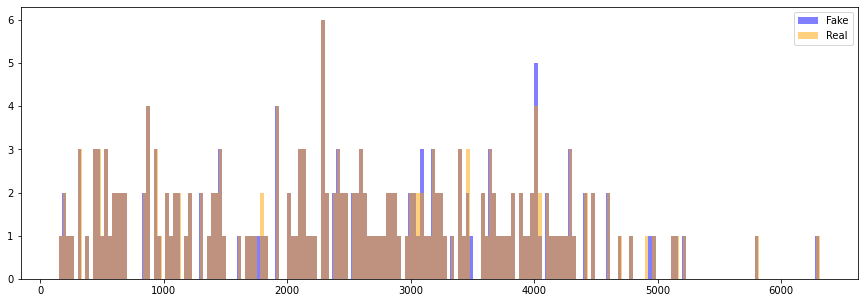


train iou_score %: 51.54


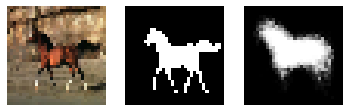

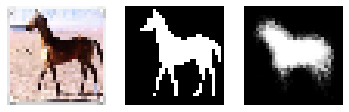

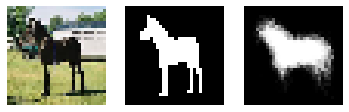

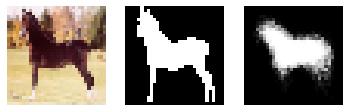

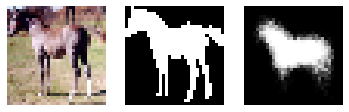

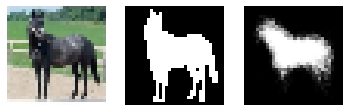

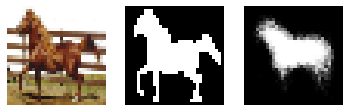

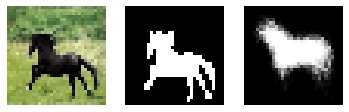

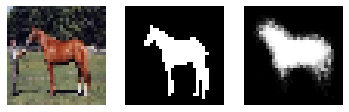

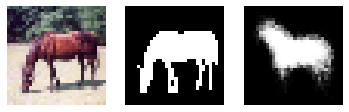


test iou_score %: 50.61


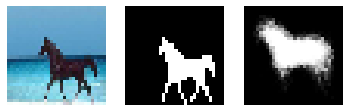

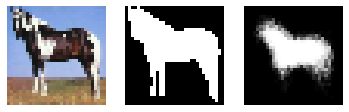

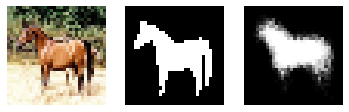

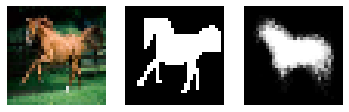

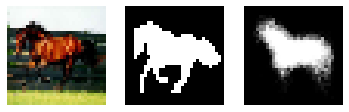

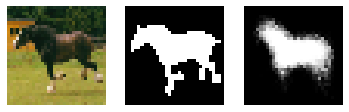

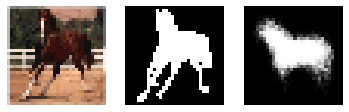

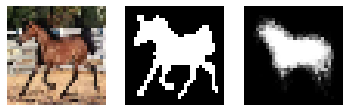

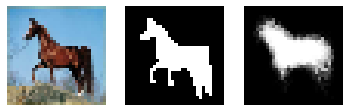

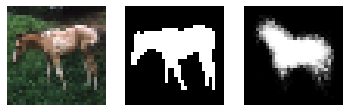


valid iou_score %: 48.69


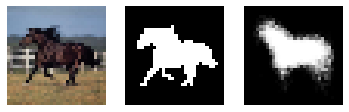

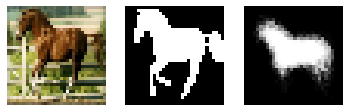

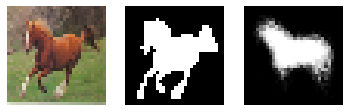

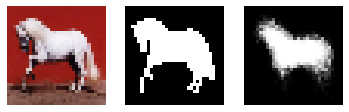

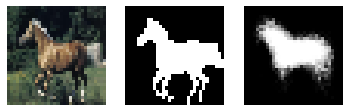

...

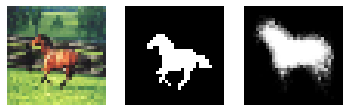

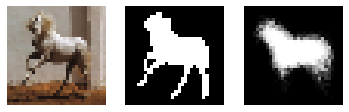

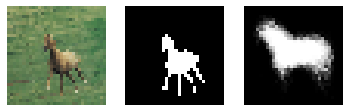

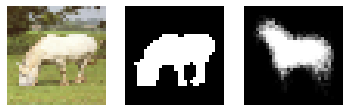

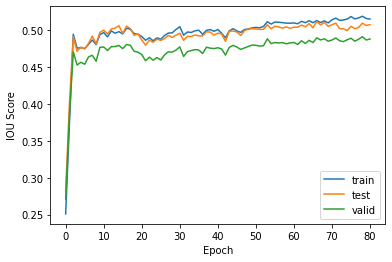

PT Gen Loss: 1.2717852592468262, Gen Loss: 2496.3759765625, Dis Loss: -1.4129585027694702, Adv Loss: -1.4861242771148682

epoch: 81
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2473909854888916, Gen Loss: 5493.71044921875, Dis Loss: -1.4410605430603027, Adv Loss: -1.4979394674301147

epoch: 82
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.252817988395691, Gen Loss: 5209.86083984375, Dis Loss: -1.6148849725723267, Adv Loss: -1.6909570693969727

epoch: 83
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2629194259643555, Gen Loss: 6693.35205078125, Dis Loss: -1.7527976036071777, Adv Loss: -1.829

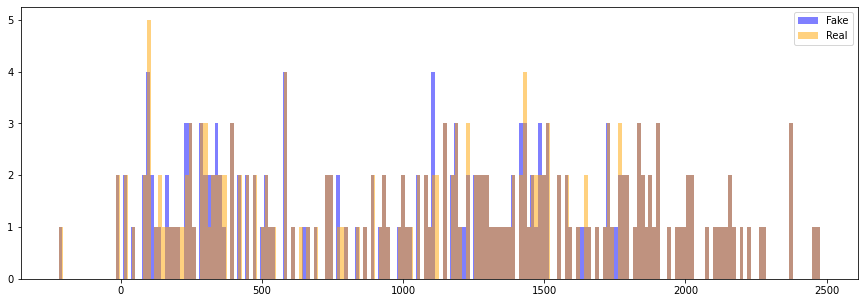


train iou_score %: 51.25


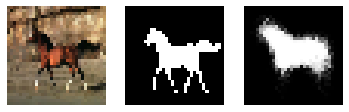

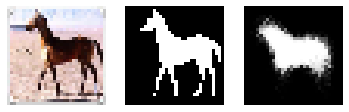

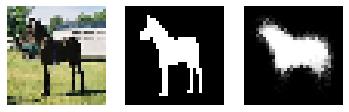

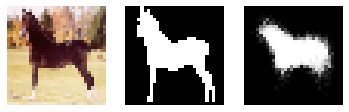

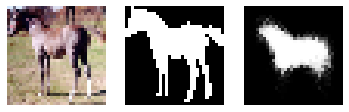

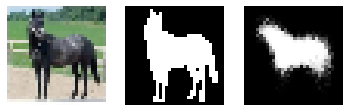

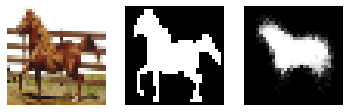

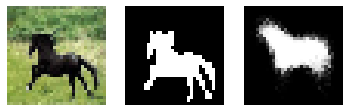

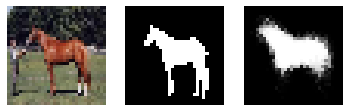

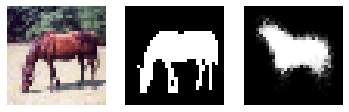


test iou_score %: 49.83


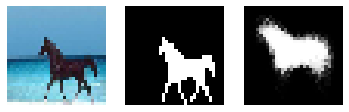

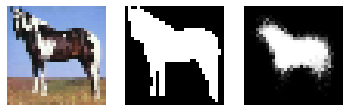

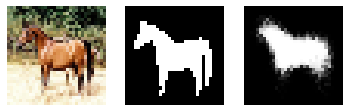

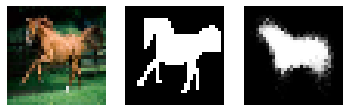

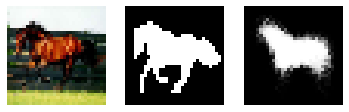

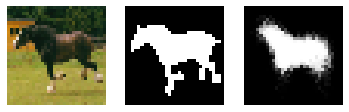

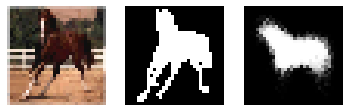

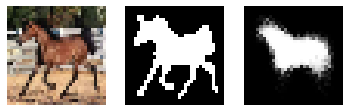

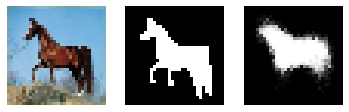

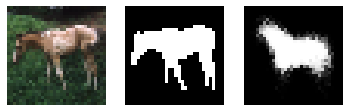


valid iou_score %: 48.35


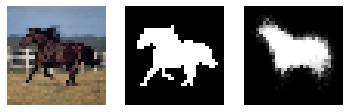

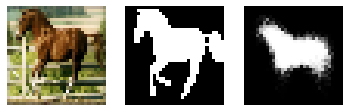

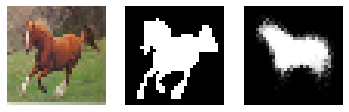

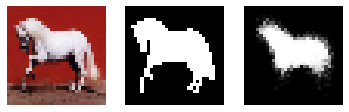

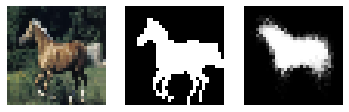

...

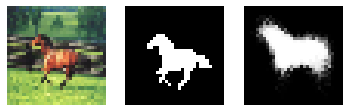

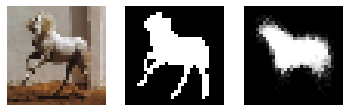

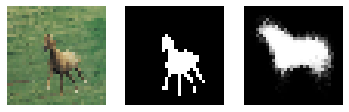

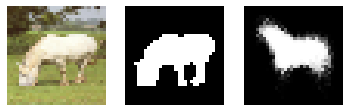

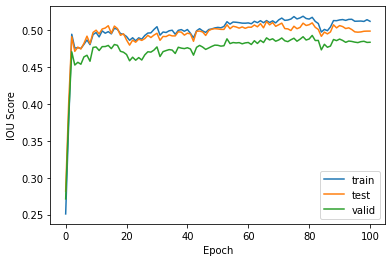

PT Gen Loss: 1.2911263704299927, Gen Loss: 1126.4874267578125, Dis Loss: -1.7110399007797241, Adv Loss: -1.7864362001419067

epoch: 101
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2856898307800293, Gen Loss: 189.7501220703125, Dis Loss: -1.57318913936615, Adv Loss: -1.6368522644042969

epoch: 102
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2699382305145264, Gen Loss: 1173.5233154296875, Dis Loss: -1.3813540935516357, Adv Loss: -1.4293731451034546

epoch: 103
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2781131267547607, Gen Loss: -1045.90185546875, Dis Loss: -1.3688868284225464, Adv Los

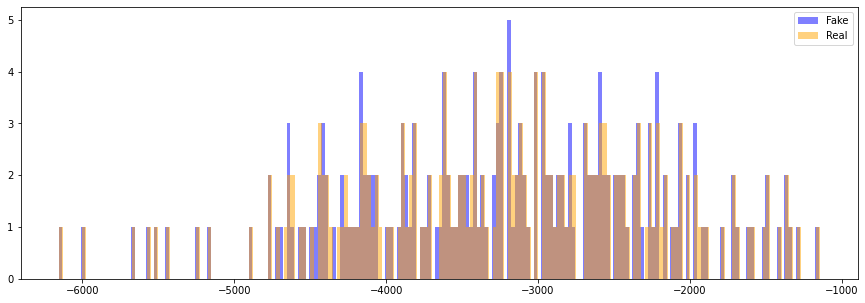


train iou_score %: 50.03


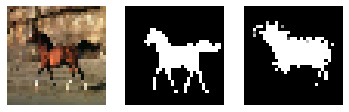

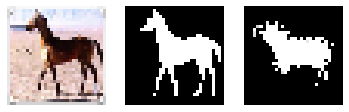

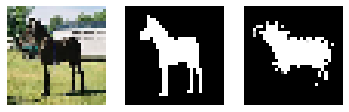

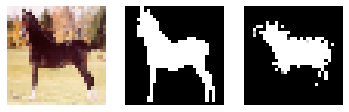

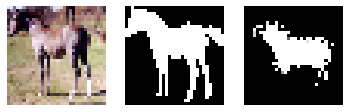

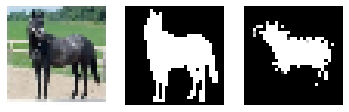

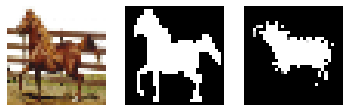

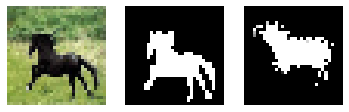

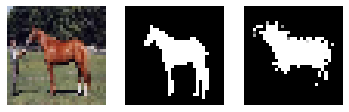

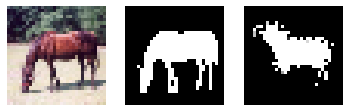


test iou_score %: 48.92


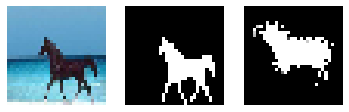

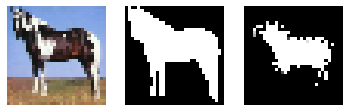

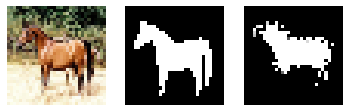

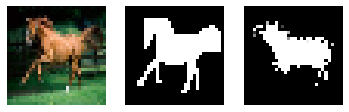

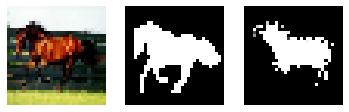

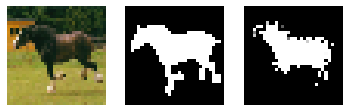

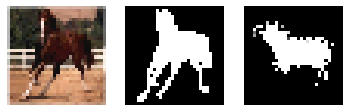

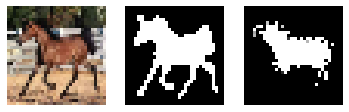

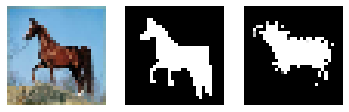

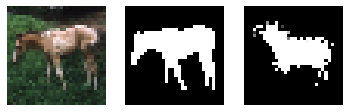


valid iou_score %: 47.37


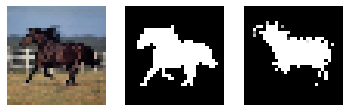

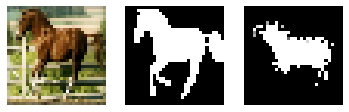

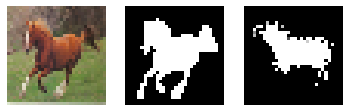

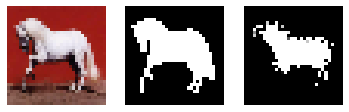

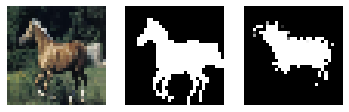

...

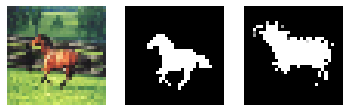

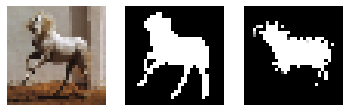

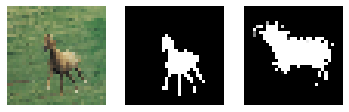

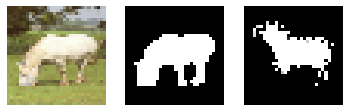

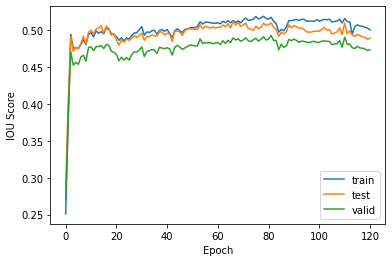

PT Gen Loss: 2.3249874114990234, Gen Loss: -3233.15185546875, Dis Loss: -7.7525553703308105, Adv Loss: -8.8837251663208

epoch: 121
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 2.2628612518310547, Gen Loss: -2470.9873046875, Dis Loss: -7.2492995262146, Adv Loss: -8.25082015991211

epoch: 122
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 2.0967204570770264, Gen Loss: -1575.457763671875, Dis Loss: -6.096740245819092, Adv Loss: -6.819741725921631

epoch: 123
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.766778588294983, Gen Loss: -584.807373046875, Dis Loss: -4.349112510681152, Adv Loss: -4.767155

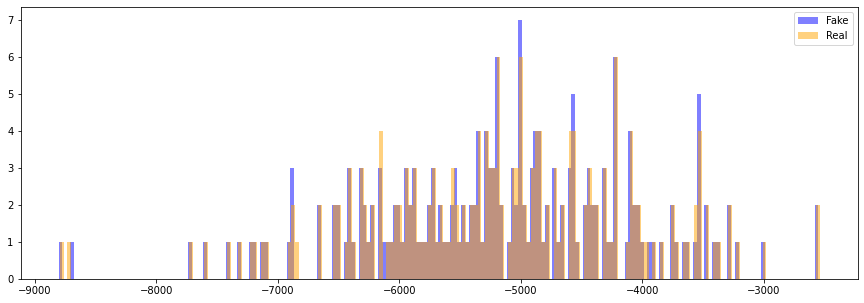


train iou_score %: 50.62


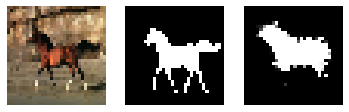

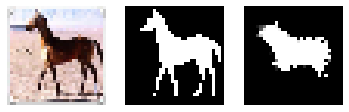

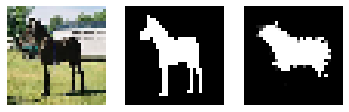

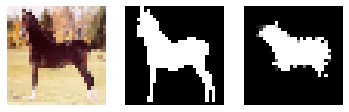

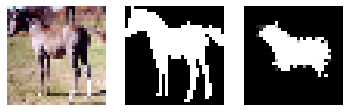

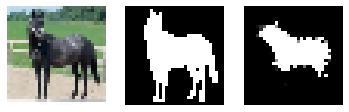

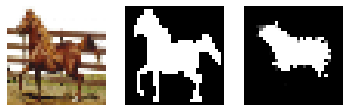

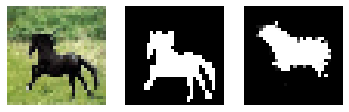

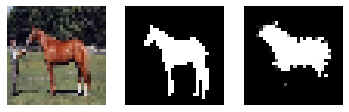

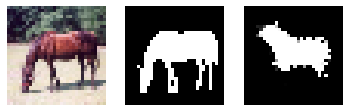


test iou_score %: 48.79


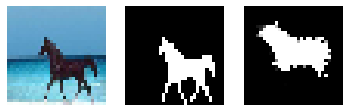

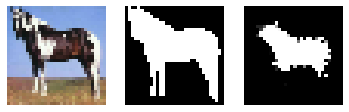

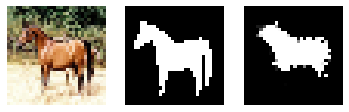

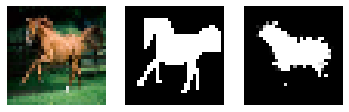

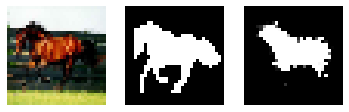

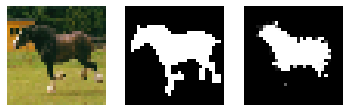

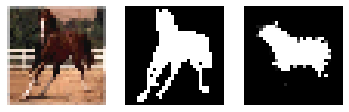

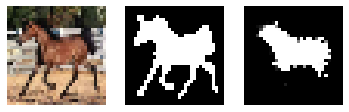

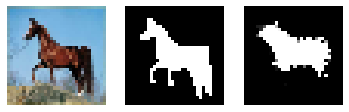

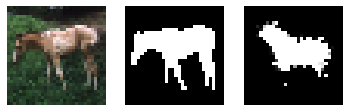


valid iou_score %: 47.41


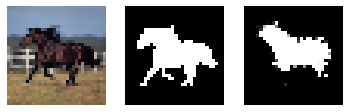

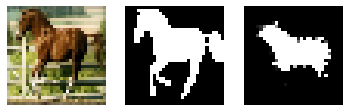

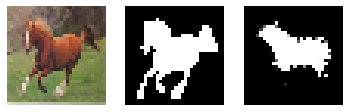

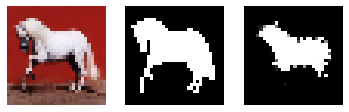

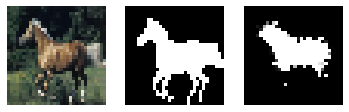

...

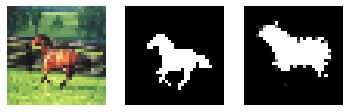

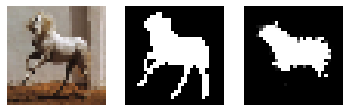

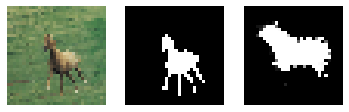

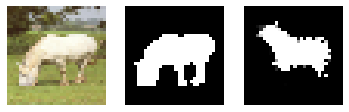

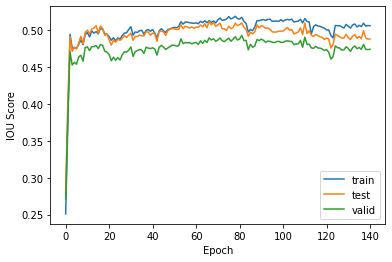

PT Gen Loss: 2.1905641555786133, Gen Loss: -5170.73681640625, Dis Loss: -7.176630020141602, Adv Loss: -8.119121551513672

epoch: 141
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 2.1897735595703125, Gen Loss: -4765.802734375, Dis Loss: -7.146549701690674, Adv Loss: -8.140000343322754

epoch: 142
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 2.1780552864074707, Gen Loss: -5141.943359375, Dis Loss: -7.094056606292725, Adv Loss: -8.052480697631836

epoch: 143
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 2.166985273361206, Gen Loss: -4292.08642578125, Dis Loss: -7.079384803771973, Adv Loss: -8.034345

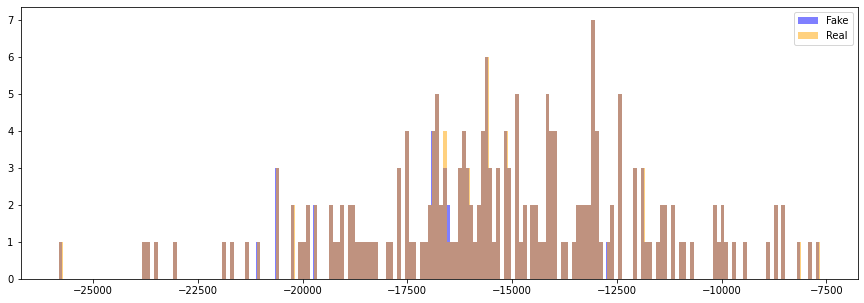


train iou_score %: 49.42


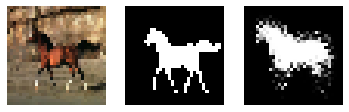

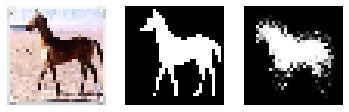

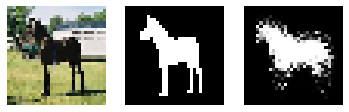

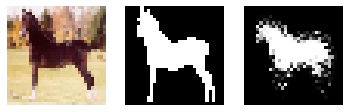

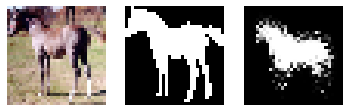

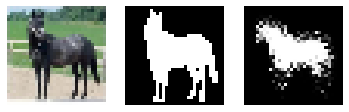

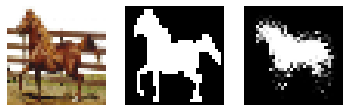

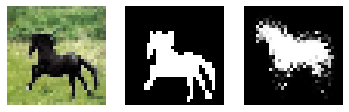

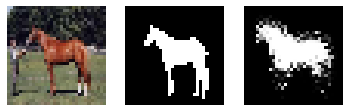

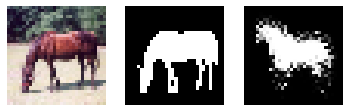


test iou_score %: 48.79


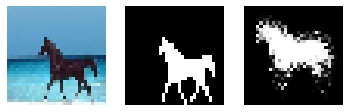

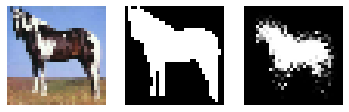

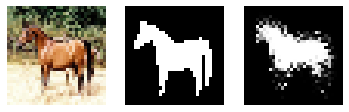

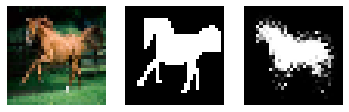

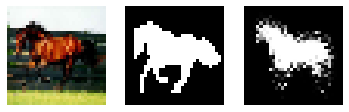

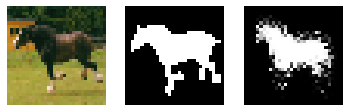

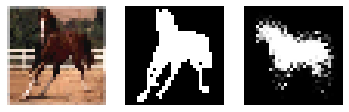

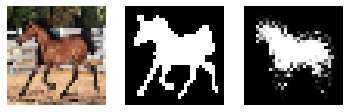

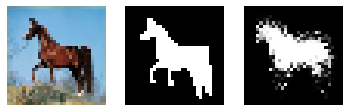

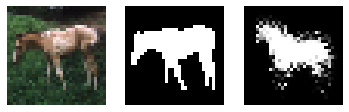


valid iou_score %: 47.17


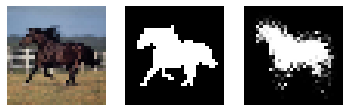

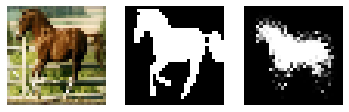

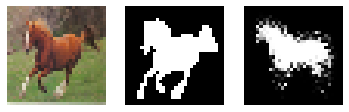

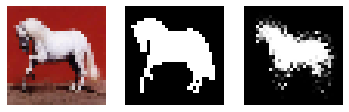

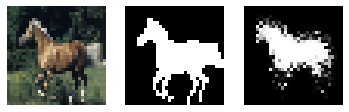

...

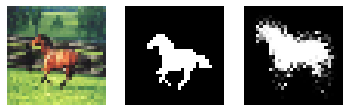

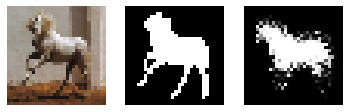

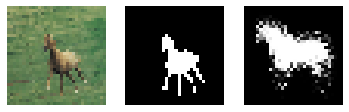

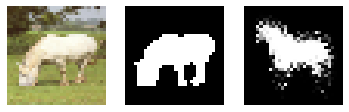

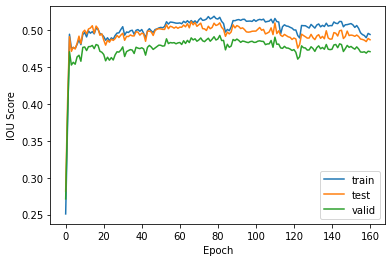

PT Gen Loss: 1.2695585489273071, Gen Loss: -15238.173828125, Dis Loss: -2.4383270740509033, Adv Loss: -2.5889062881469727

epoch: 161
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.3033435344696045, Gen Loss: -14533.3525390625, Dis Loss: -2.535301446914673, Adv Loss: -2.6812500953674316

epoch: 162
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.3056756258010864, Gen Loss: -14282.7265625, Dis Loss: -2.7562243938446045, Adv Loss: -2.9261717796325684

epoch: 163
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.3150880336761475, Gen Loss: -13219.7509765625, Dis Loss: -2.8036277294158936, Adv Loss: -2

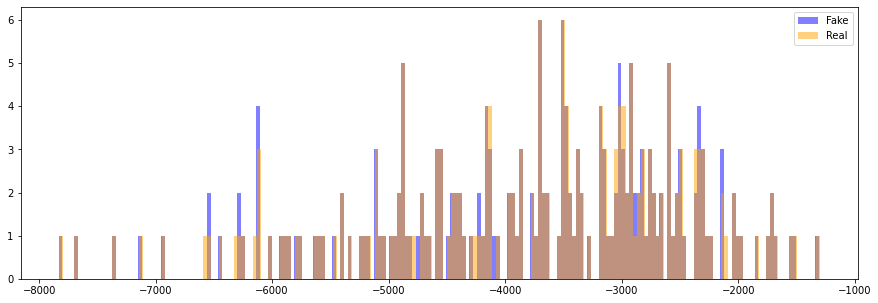


train iou_score %: 51.3


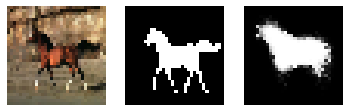

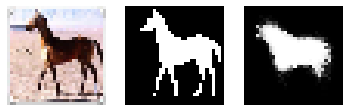

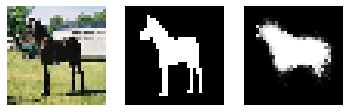

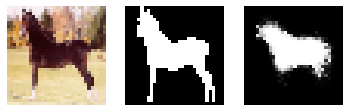

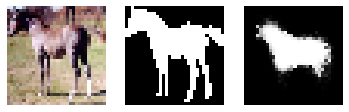

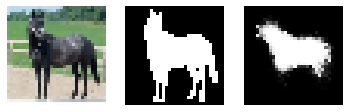

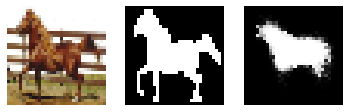

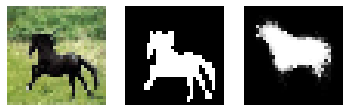

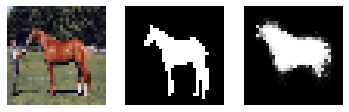

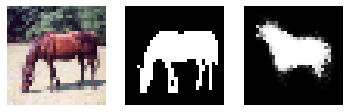


test iou_score %: 49.8


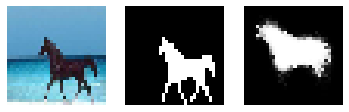

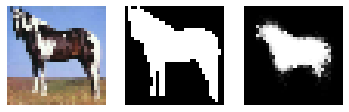

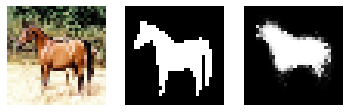

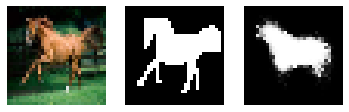

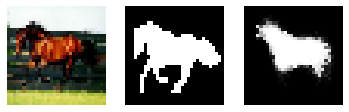

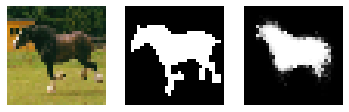

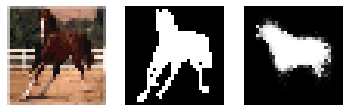

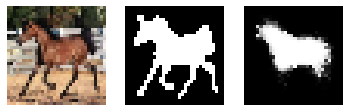

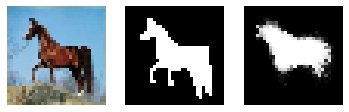

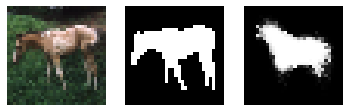


valid iou_score %: 48.04


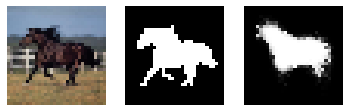

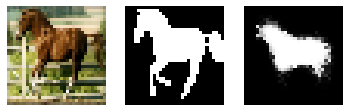

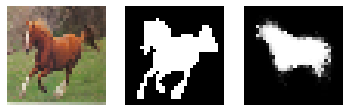

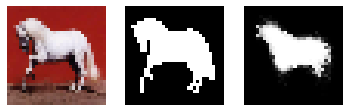

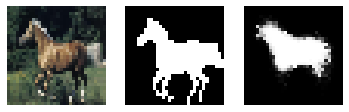

...

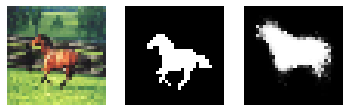

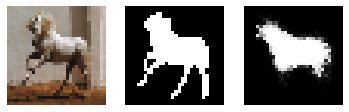

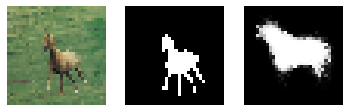

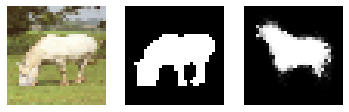

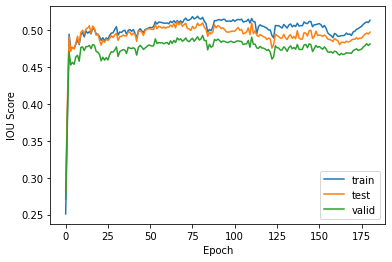

PT Gen Loss: 1.2657712697982788, Gen Loss: -3816.332275390625, Dis Loss: -1.7720630168914795, Adv Loss: -1.8591113090515137

epoch: 181
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.268355131149292, Gen Loss: -917.1177368164062, Dis Loss: -1.8487637042999268, Adv Loss: -1.9305779933929443

epoch: 182
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2937997579574585, Gen Loss: 1339.4022216796875, Dis Loss: -2.1258556842803955, Adv Loss: -2.22796630859375

epoch: 183
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.2877713441848755, Gen Loss: 2689.649169921875, Dis Loss: -2.0947837829589844, Adv Los

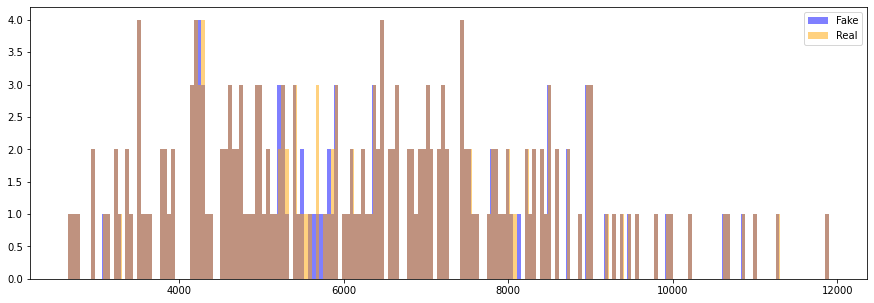


train iou_score %: 51.85


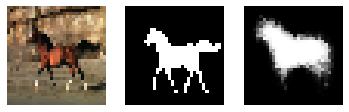

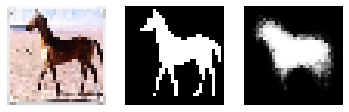

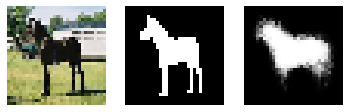

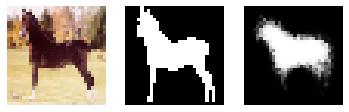

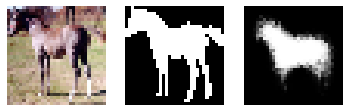

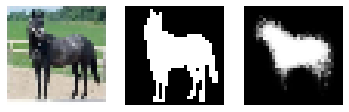

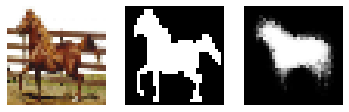

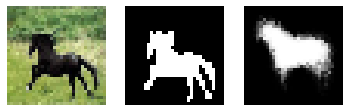

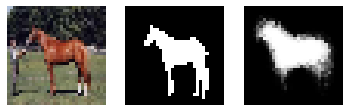

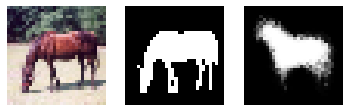


test iou_score %: 50.4


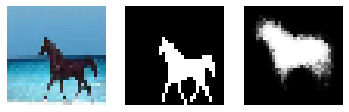

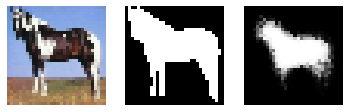

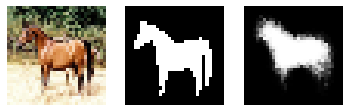

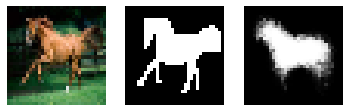

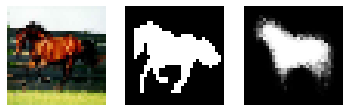

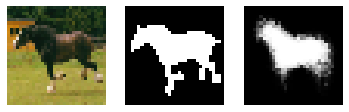

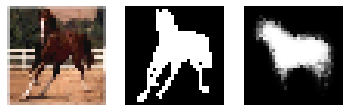

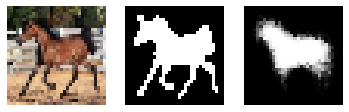

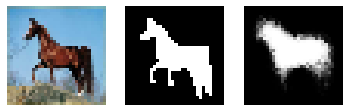

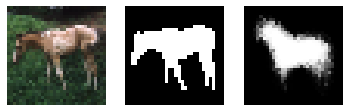


valid iou_score %: 48.79


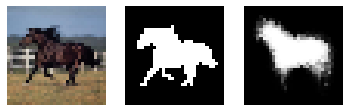

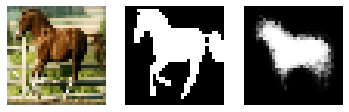

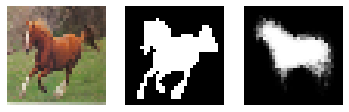

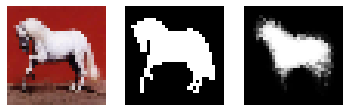

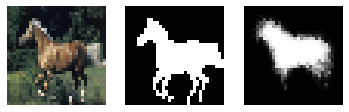

...

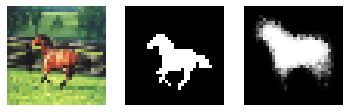

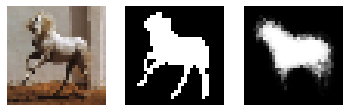

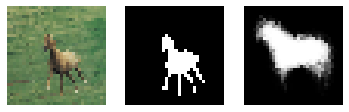

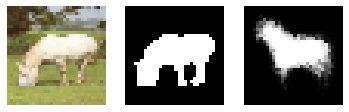

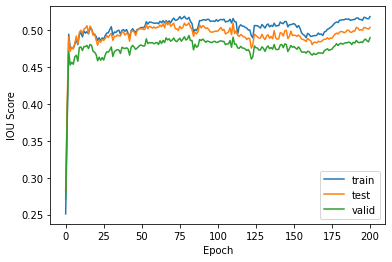

PT Gen Loss: 1.2653799057006836, Gen Loss: 6230.599609375, Dis Loss: -1.3293404579162598, Adv Loss: -1.379697322845459

epoch: 201
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.271347165107727, Gen Loss: 2591.7373046875, Dis Loss: -1.5793377161026, Adv Loss: -1.633945345878601

epoch: 202
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.3100662231445312, Gen Loss: 2830.05224609375, Dis Loss: -1.8146072626113892, Adv Loss: -1.9061328172683716

epoch: 203
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
PT Gen Loss: 1.286225438117981, Gen Loss: 5000.24609375, Dis Loss: -1.8918107748031616, Adv Loss: -1.98152828216

KeyboardInterrupt: 

In [11]:
# general
batch_size = 8
n_epoch = 300
n_figs = 10

# disc
n_update_dis = 1
d_learning_rate = 0.0005

# pretrain gen
alpha = 0.01
pt_gen = True
pt_g_learning_rate = 0.001

# ebm gen
inf_iter = 10 #alpha
inf_rate = 2 #delta
g_learning_rate = 0.0005

##############################################################################################################

# create tf dataset generator object
N = len(xdata)
train_dataset = tf.data.Dataset.from_tensor_slices((xdata, ydata))
train_dataset = train_dataset.shuffle(buffer_size=N)
train_dataset = train_dataset.batch(batch_size=batch_size, drop_remainder=False)

# Initialize Networks
gen = Generator()
dis = Discriminator()

# Initialize Optimizer
gen_opt = tf.keras.optimizers.Adam(g_learning_rate)
gen_opt_pt = tf.keras.optimizers.Adam(pt_g_learning_rate)
dis_opt = tf.keras.optimizers.Adam(d_learning_rate)

# Initialize Metrics
adv_loss = tf.keras.metrics.Mean(name = 'Adversarial_Loss')
dis_loss = tf.keras.metrics.Mean(name = 'Discriminator_Loss')
gen_loss = tf.keras.metrics.Mean(name = 'Generator_Loss')
gen_pretrain_loss = tf.keras.metrics.Mean(name = 'Generator_Pretrain_Loss')

train(train_dataset, n_epoch, n_update_dis, inf_iter, inf_rate, pt_gen, alpha)